In [1]:
from cartoGRAPHs import *
import random 
from sklearn.decomposition import PCA
from sklearn import preprocessing
import json
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt 
import colorsys
import pickle as pk

/opt/anaconda3/envs/Exposurome/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


DEBUG: in init: import done


_____
# E E N / exposure-exposure network 
_____

In [2]:
G = nx.read_weighted_edgelist("output/backbone_exp_graph_significant_weighted.edgelist")
print('G nodes: ',len(G.nodes())) 
print('G edges: ',len(G.edges()))


with open('output/Communities/Infomap/third_iteration_infomap.pickle', 'rb') as handle:
    first_level_infomap = pickle.load(handle)

with open('output/Communities/Infomap/second_iteration_infomap.pickle', 'rb') as handle:
    second_level_infomap = pickle.load(handle)

with open('output/Communities/Infomap/first_iteration_infomap.pickle', 'rb') as handle:
    third_level_infomap = pickle.load(handle)

with open('output/Communities/Infomap/ee_ji_first_infomap_iteration.pickle', 'rb') as handle:
    ee_first_level_infomap = pickle.load(handle)

with open('output/Communities/Infomap/ee_ji_second_infomap_iteration.pickle', 'rb') as handle:
    ee_second_level_infomap = pickle.load(handle)

G nodes:  9764
G edges:  736470


In [3]:
G.name = "Exposureome"
G.graph["desc"] = "A short description here. "

### calculate features based on communities 
+ #1 THIRD LEVEL COMMUNITIES 

In [4]:
exp_list=[]
for exp_l in third_level_infomap.values():
    for e in exp_l:
        exp_list.append(e)
print(len(exp_list))

9764


In [5]:
layout_method = 'third-level-infomap' 

d_comm_third = {}
for g in G.nodes():
    for k,v in third_level_infomap.items():
        if g in v:
            d_comm_third[g] = k

d_communities_third = {}
for g in G.nodes():
    intermed_list = [0]*len(third_level_infomap.keys())
    for k,v in third_level_infomap.items():
        if g in v:
            intermed_list[k-1] = 1
    d_communities_third[g] = intermed_list
d_nodefeatures_third = d_comm_third

FM_communities_third = pd.DataFrame(d_communities_third).T

print(len(third_level_infomap))
FM_communities_third

101


,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
C534883,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C116515,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C014218,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C581356,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C560905,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D005486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
C507351,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C036615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C037657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
len(third_level_infomap.keys())

101

+ #2 SECOND LEVEL COMMUNITITES

In [7]:
layout_method = 'second-level-infomap' 

d_comm_second = {}
for g in G.nodes():
    for k,v in second_level_infomap.items():
        if g in v:
            d_comm_second[g] = k

d_communities_second = {}
for g in G.nodes():
    intermed_list = [0]*len(second_level_infomap.keys())
    for k,v in second_level_infomap.items():
        if g in v:
            intermed_list[k-1] = 1
    d_communities_second[g] = intermed_list
d_nodefeatures_second = d_comm_second

FM_communities_second = pd.DataFrame(d_communities_second).T

print(len(second_level_infomap))
FM_communities_second

444


,0,1,2,3,4,5,6,7,8,9,...,434,435,436,437,438,439,440,441,442,443
C534883,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C116515,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C014218,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C581356,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C560905,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D005486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
C507351,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C036615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C037657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


+ #3 FIRST LEVEL COMMUNITIES

In [8]:
layout_method = 'first-level-infomap' 

d_comm_first = {}
for g in G.nodes():
    for k,v in first_level_infomap.items():
        if g in v:
            d_comm_first[g] = k

d_communities_first = {}
for g in G.nodes():
    intermed_list = [0]*len(first_level_infomap.keys())
    for k,v in first_level_infomap.items():
        if g in v:
            intermed_list[k-1] = 1
    d_communities_first[g] = intermed_list
d_nodefeatures_first = d_comm_first

FM_communities_first = pd.DataFrame(d_communities_first).T

print(len(first_level_infomap))
FM_communities_first

458


,0,1,2,3,4,5,6,7,8,9,...,448,449,450,451,452,453,454,455,456,457
C534883,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C116515,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C014218,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C581356,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C560905,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D005486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
C507351,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C036615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C037657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
r = 0.9
alpha = 1.0

A = nx.adjacency_matrix(G, nodelist=list(G.nodes()))
DM_m = rnd_walk_matrix2(A, r, alpha, len(G.nodes()))
FM_structural = pd.DataFrame(DM_m)
FM_structural.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural.index=list(G.nodes())
FM_structural.columns=list(G.nodes())
FM_structural

,C534883,C116515,C014218,C581356,C560905,C513485,C048336,C018258,C003524,C004759,...,D004151,C512119,C120841,C025727,D005182,D005486,C507351,C036615,C037657,C051521
C534883,0.900113,3.669356e-04,0.000200,0.000459,0.000406,0.000393,0.001605,2.832925e-04,3.717560e-04,4.377895e-04,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C116515,0.001996,9.000906e-01,0.000254,0.000001,0.000002,0.000462,0.000012,8.813719e-07,1.554304e-03,6.340628e-04,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C014218,0.001593,3.712092e-04,0.900053,0.000004,0.000004,0.000395,0.000005,9.669170e-07,3.758368e-04,4.417640e-04,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C581356,0.000907,3.818991e-07,0.000001,0.900093,0.000606,0.000001,0.000038,7.304205e-06,3.864733e-07,4.527043e-07,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C560905,0.000910,7.872922e-07,0.000001,0.000689,0.900082,0.000006,0.000040,7.376565e-06,7.960605e-07,9.322654e-07,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D005486,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.090909,0.909091,0.000000,0.000000,0.000000,0.000000
C507351,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.909091,0.090909,0.000000,0.000000
C036615,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.090909,0.909091,0.000000,0.000000
C037657,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.909091,0.090909


___ 
# 1 VIS 1 - Visualizing 1 selected community of each level
___

In [10]:
## ########################################
# select which level :
########################################

layoutname = 'thirdlevel'
x_level_infomap = third_level_infomap
d_comm = d_comm_third
FM_communities = FM_communities_third

# set visualization parameters (i.e. colors for communities, node size, features.. )
colorlist_verybright = ['#FF355E','#FF6037','#FF9933',
               '#FFCC33', '#FFFF66', '#CCFF00','#A7F432',
                '#AAF0D1', '#50BFE6', '#FF6EFF',
                '#FF00CC', 
]

colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

colorlist_fin = colorlist_paper * (len(x_level_infomap.keys())//len(colorlist_paper)) +colorlist_paper

# #try to get unique colors for each community instead of hardcoded colors 
# colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(x_level_infomap.keys()))
# colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
# random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign random color to each community
d_comm_col = dict(zip(x_level_infomap.keys(), colorlist_fin))
print(len(d_comm_col))

# match community colors assigned to nodes-community assignment
d_nodecolors_hex = {} 
for node,comm in d_comm.items():
    for com,col in d_comm_col.items():
        if comm == com:
            d_nodecolors_hex[node] = col 

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25

edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'

# get all subgraphs of all communities : 
nodes_allcommunities = []
subgraphs_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):

    nodes_comm0 = []
    for node, comm in d_comm.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_allcommunities.append(nodes_comm0)
    subgraphs_allcommunities.append(G_comm0)


number of unique colors: 16
101


In [11]:
len(d_comm)

9764

In [12]:
FM_communities

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
C534883,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C116515,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C014218,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C581356,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C560905,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D005486,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
C507351,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C036615,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C037657,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### FEATURE MODULATED LAYOUT 
structural (global) with functional (communities)

In [13]:

scalar_val = 1
layout_method = 'modulated-scal'+str(scalar_val)
DF_structural = FM_structural
DF_functional = FM_communities.T
DF_merge = feature_modulation(DF_structural,DF_functional, scalar_val)

n_n = 8
spr = 1.0
md = 0.5
metr2D = 'cosine'

posG2D_modulated = layout_portrait_umap(G,
                                   DF_merge,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

posG2D_new = posG2D_modulated

/opt/anaconda3/envs/Exposurome/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [14]:
posG3D_modulated = layout_portrait_umap(G,
                                   DF_structural,
                                   3,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

posG3D_new = posG3D_modulated

/opt/anaconda3/envs/Exposurome/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [15]:
exposurome_3dpos=[]
exposurome_col=[]
exposurome_col_dict={}
for exp,pos in posG3D_new.items():
    exposurome_3dpos.append(pos)
    for i,n_comm in enumerate(nodes_allcommunities):
        if exp in n_comm:
            exposurome_col.append(d_comm_col[i+1])
            exposurome_col_dict[exp]=d_comm_col[i+1]



In [16]:
len(set(exposurome_col_dict.values()))

16

In [17]:
len(exposurome_col_dict)

9764

In [18]:
len(set(exposurome_col_dict.values()))

16

In [19]:

with open('output/ji_exposurome_col_dict_infomap.pickle', 'wb') as handle:
    pickle.dump(exposurome_col_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [20]:

np.savetxt("output/VR/Exposuromepos3d_infomap.csv", 
           exposurome_3dpos,
           delimiter =",", 
           fmt ='% s')

In [21]:
from PIL import ImageColor


In [22]:

exposurome_col_rgb=[]
for hexcol in exposurome_col:
    rgb=list(ImageColor.getcolor(hexcol, "RGB"))
    rgb.append(100)
    exposurome_col_rgb.append(rgb)

In [23]:

np.savetxt("output/VR/Exposuromecol_infomap.csv", 
           exposurome_col_rgb,
           delimiter =",", 
           fmt ='% s')

In [24]:
#I need to relabel the nodes to indexes
exposurome_map={}
exp_id_list=[]
c=0
for exp_node in posG3D_new.keys():
    exposurome_map[exp_node]=c
    exp_id_list.append(exp_node)
    c=c+1
    

In [25]:
#Let's change the names of these communities based on their size

#BROADEST==third
third_level_infomap_sort=dict(sorted(third_level_infomap.items(), key=lambda item: len(item[1]), reverse = True))
third_renamed_third_conversion_dict={}
renamed_third_level_infomap_sort={}
c=1
for com,explist in third_level_infomap_sort.items():
    renamed_third_level_infomap_sort[str(c)]=explist
    third_renamed_third_conversion_dict[com]=str(c)
    c=c+1
    
#MIDDLE==second

second_renamed_second_conversion_dict={}
renamed_second_level_infomap_sort={}

for br_com,mid_com in ee_second_level_infomap.items():
    if len(mid_com)==1:
        newcom=third_renamed_third_conversion_dict[br_com]
        renamed_second_level_infomap_sort[newcom]=second_level_infomap[mid_com[0]]
        second_renamed_second_conversion_dict[mid_com[0]]=newcom
    else:
        sorted_list=list(sorted(mid_com, key=lambda item: len(second_level_infomap[item]), reverse = True))
        for i in range(len(sorted_list)):
            q=i+1
            newcom=third_renamed_third_conversion_dict[br_com]+"_"+str(q)
            renamed_second_level_infomap_sort[newcom]=second_level_infomap[sorted_list[i]]
            second_renamed_second_conversion_dict[sorted_list[i]]=newcom
        
#FINEST==first  

first_renamed_first_conversion_dict={}
renamed_first_level_infomap_sort={}

for mid_com,fin_com in ee_first_level_infomap.items():
    if len(fin_com)==1:
        newcom=second_renamed_second_conversion_dict[mid_com]
        renamed_first_level_infomap_sort[newcom]=first_level_infomap[fin_com[0]]
        first_renamed_first_conversion_dict[fin_com[0]]=newcom
    else:
        sorted_list=list(sorted(fin_com, key=lambda item: len(first_level_infomap[item]), reverse = True))
        for i in range(len(sorted_list)):
            q=i+1
            newcom=second_renamed_second_conversion_dict[mid_com]+"_"+str(q)
            renamed_first_level_infomap_sort[newcom]=first_level_infomap[sorted_list[i]]
            first_renamed_first_conversion_dict[sorted_list[i]]=newcom
        

In [26]:
third_renamed_third_conversion_dict_rev={}
for k,v in third_renamed_third_conversion_dict.items():
    third_renamed_third_conversion_dict_rev[v]=k

second_renamed_second_conversion_dict_rev={}
for k,v in second_renamed_second_conversion_dict.items():
    second_renamed_second_conversion_dict_rev[v]=k

first_renamed_first_conversion_dict_rev={}
for k,v in first_renamed_first_conversion_dict.items():
    first_renamed_first_conversion_dict_rev[v]=k

In [27]:
tot_v=[]
for k,v in renamed_second_level_infomap_sort.items():
    tot_v.extend(v)
len(tot_v)

9764

In [28]:
tremap_color_dict={}
for com,explist in renamed_third_level_infomap_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(exposurome_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)

for com,explist in renamed_second_level_infomap_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(exposurome_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)
        
for com,explist in renamed_first_level_infomap_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(exposurome_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)
len(tremap_color_dict)

481

In [29]:

color_list=[]
com_list=[]
value_list=[]
parent_list=[]

for com, color in tremap_color_dict.items():
    com_list.append(com)
    color_list.append(color)
    
    comgrouplist=com.split("_")
    if len(comgrouplist)==1:
        value_list.append(len(renamed_third_level_infomap_sort[com]))
        parent_list.append("")
    
    elif len(comgrouplist)==2:
        try:
            value_list.append(len(renamed_second_level_infomap_sort[com]))
            oldcom=second_renamed_second_conversion_dict_rev[com]
            for brcom,midcomlist in ee_second_level_infomap.items():
                if oldcom in midcomlist:
                    parent_list.append(third_renamed_third_conversion_dict[brcom])
        except:
            value_list.append(len(renamed_first_level_infomap_sort[com]))
            oldcom=first_renamed_first_conversion_dict_rev[com]
            for midcom,fincomlist in ee_first_level_infomap.items():
                if oldcom in fincomlist:
                    parent_list.append(second_renamed_second_conversion_dict[midcom])
            
        
    else:
        value_list.append(len(renamed_first_level_infomap_sort[com]))
        oldcom=first_renamed_first_conversion_dict_rev[com]
        for midcom,fincomlist in ee_first_level_infomap.items():
            if oldcom in fincomlist:
                parent_list.append(second_renamed_second_conversion_dict[midcom])
        

In [35]:
for k,v in renamed_third_level_infomap_sort.items():
    if 'D000078306' in v:
        print(k)

1


In [37]:
for k,v in renamed_second_level_infomap_sort.items():
    if 'D000078306' in v:
        print(k)

1_31


In [39]:
len(renamed_second_level_infomap_sort['1_31'])

21

In [65]:
second_renamed_second_conversion_dict_rev['1_31']

29

In [66]:
first_renamed_first_conversion_dict_rev['1_31']

30

In [38]:
for k,v in renamed_first_level_infomap_sort.items():
    if 'D000078306' in v:
        print(k)

1_31


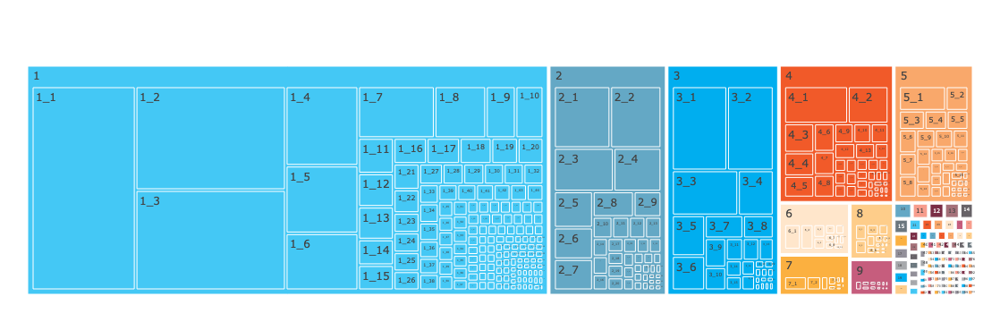

In [31]:
import plotly.graph_objects as go


fig = go.Figure(go.Treemap(
    branchvalues = "total",
    labels = com_list,
    values = value_list,
    parents = parent_list,
    marker_colors = color_list
))

fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.write_image('output/Figures/SF15B_v01_post_rev.pdf')
fig.show()

In [32]:
#We are using the new nomenclature
fine_grained_communities_list=[]
middle_communities_list=[]
broad_communities_list=[]

for com,explist in renamed_first_level_infomap_sort.items():
    comlist=com.split("_")
    if len(comlist)==1:
        fine_grained_communities_list.append(com)
    elif len(comlist)==2:
        fine_grained_communities_list.append(com)
        middle_communities_list.append(comlist[0])
    else:
        fine_grained_communities_list.append(com)
        middle_communities_list.append(comlist[0]+"_"+comlist[1])
        broad_communities_list.append(comlist[0])

fine_grained_communities_set=set(fine_grained_communities_list)
middle_communities_set=set(middle_communities_list)
broad_communities_set=set(broad_communities_list)
print(len(broad_communities_set))  
print(len(middle_communities_set))  
print(len(fine_grained_communities_set))  

9
23
458


In [33]:
fine_grained_communities_dict={}
middle_communities_dict={}
broad_communities_dict={}

for com in fine_grained_communities_set:
    fine_grained_communities_dict[com]=renamed_first_level_infomap_sort[com]
    
for com in middle_communities_set:
    try:
        middle_communities_dict[com]=renamed_second_level_infomap_sort[com]
    except:
        middle_communities_dict[com]=renamed_third_level_infomap_sort[com]

for com in broad_communities_set:
    broad_communities_dict[com]=renamed_third_level_infomap_sort[com]
    
with open('output/Communities/Infomap/ji_infomap_fine_grained_communities_dict.pickle', 'wb') as handle:
    pk.dump(fine_grained_communities_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

with open('output/Communities/Infomap/ji_infomap_middle_communities_dict.pickle', 'wb') as handle:
    pk.dump(middle_communities_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

with open('output/Communities/Infomap/ji_infomap_broad_communities_dict.pickle', 'wb') as handle:
    pk.dump(broad_communities_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

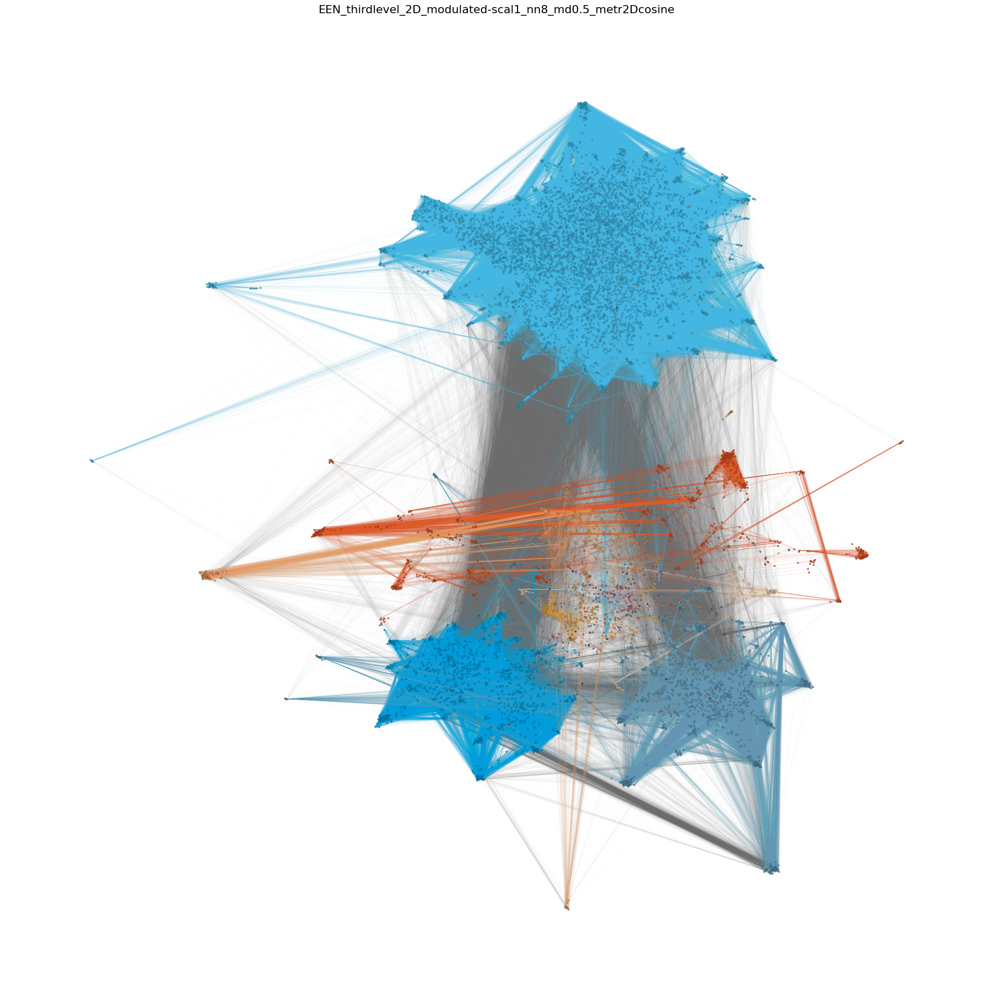

In [34]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values())-1,max(d_comm.values())):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm-1 == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G,posG2D_new, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = colors_allcommunities[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 0.5, edge_color = colors_allcommunities[i], alpha = 0.075)

plt.box(False)
plt.savefig('output/Figures/SF15A_part1_v01_post_rev.pdf',dpi=300)
plt.savefig('output/Figures/SF15A_part1_v01_post_rev.png',dpi=300)

plt.show()


In [42]:
check_colors_allcommunities=[]
for i in range(len(colors_allcommunities)):
    if i==0:
        check_colors_allcommunities.append(d_comm_col[1])
    else:
        check_colors_allcommunities.append("grey")

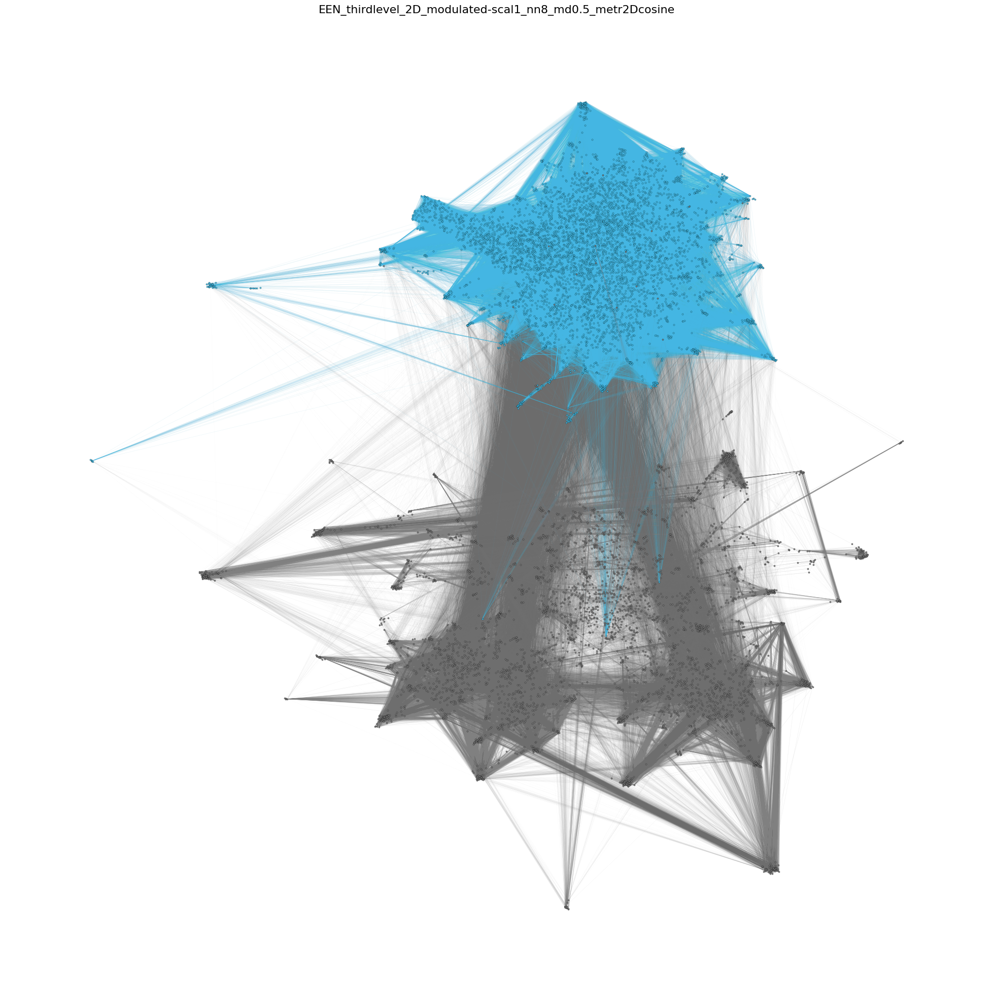

In [43]:
fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G,posG2D_new, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = check_colors_allcommunities[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 0.5, edge_color = check_colors_allcommunities[i], alpha = 0.075)

plt.box(False)

plt.show()

In [14]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

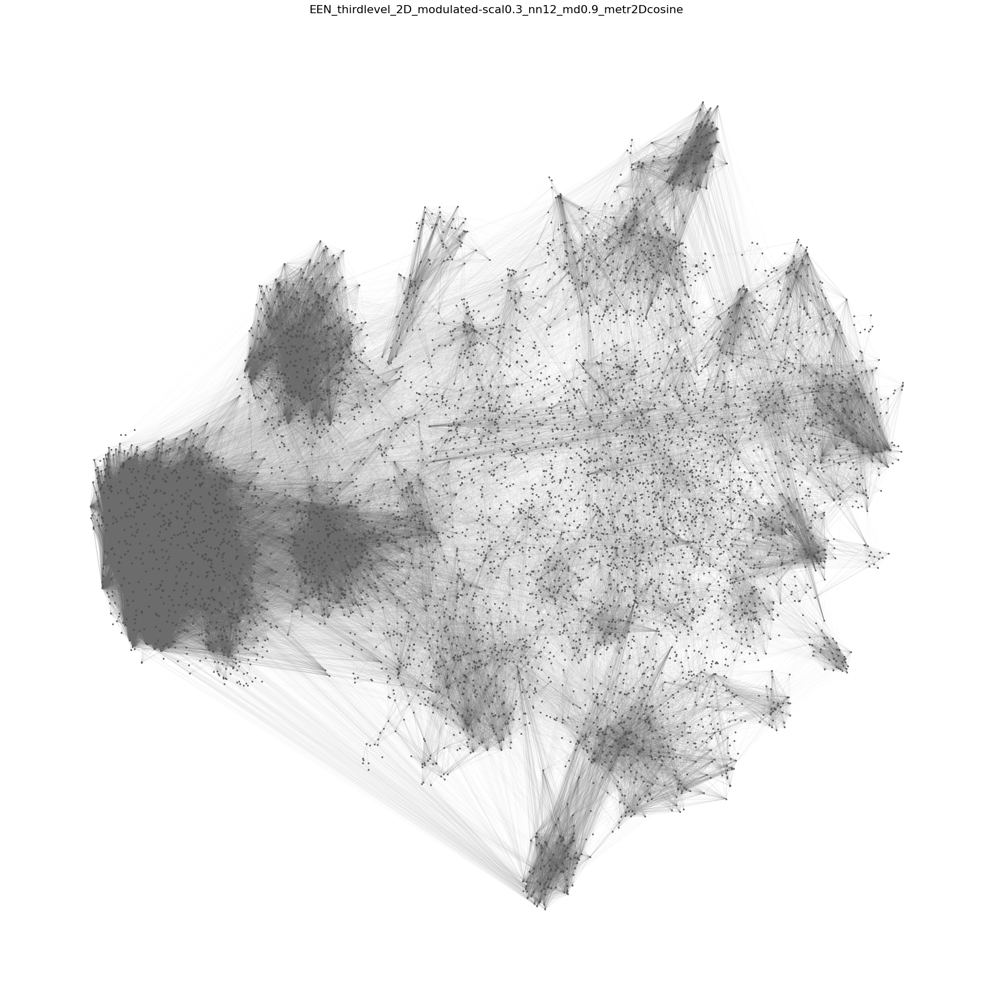

In [15]:
fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G,posG2D_new, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = '#6C6C6C', node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 0.5, edge_color ='#6C6C6C', alpha = 0.075)

plt.box(False)

plt.show()

# Specific Communities per Level - Vis

### THIRD LEVEL

Number of exposures in community: 5384
Specific Graph: Graph named 'Exposureome' with 5384 nodes and 525484 edges


/opt/anaconda3/envs/Exposurome/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of Nodes: (to match G_sub_third nodes):  5384
communities of second level in third level community selected:  {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151}
colorlist fin: ['#44c8f5', '#00aeef', '#64a8c5', '#f15a29', '#f9a86b', '#ffe6cb', '#fbb040', '#fecd8a', '#c65d7d', '#f79d8d', '#7a2d45', '#a47179', '#676267', '#6b777e', '#93909a', '#a7a9ac']
number of unique colors: 16
16
Number of su

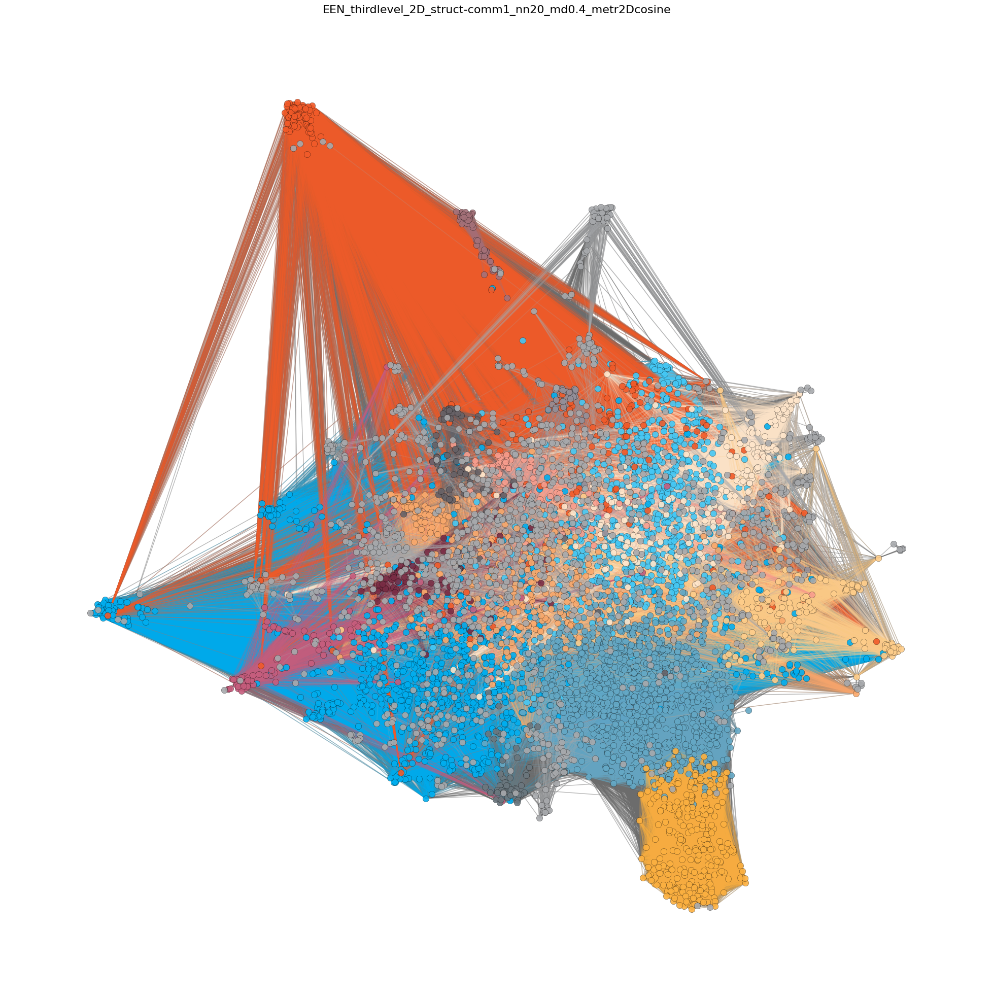

In [98]:
layoutname = 'thirdlevel'

##########################################################
spec_comm_third = 1 #Salvo's selection 1
##########################################################

sublist_third = []
for k,v in d_comm_third.items():
    if v == spec_comm_third:
        sublist_third.append(k)

d_selectedcommunity_thirdlevel = {spec_comm_third:sublist_third}
print("Number of exposures in community:" , len(*d_selectedcommunity_thirdlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_third.values()),max(d_comm_third.values())):
    nodes_comm0 = []
    for node, comm in d_comm_third.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_subcommunities.append(nodes_comm0)
    subgraphs_subcommunities.append(G_comm0)
    
G_sub_third = subgraphs_subcommunities[spec_comm_third-1]
print("Specific Graph:" , G_sub_third)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_third) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_third, nodelist=list(G_sub_third.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_third.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_third.nodes())
FM_structural_sub.columns=list(G_sub_third.nodes())

n_n = 20
spr = 0.6
md = 0.4
metr2D = 'cosine'
posG2D_third = layout_portrait_umap(G_sub_third,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_third nodes): ', len(posG2D_third))


########################################
# COLORS 
########################################

# get all nodes of 3rd level subgraph - and their second level assigned communities
d_comm_second_selected = {}
for node in G_sub_third.nodes():
    if node in d_comm_second.keys():    
        d_comm_second_selected[node] = d_comm_second[node]
print("communities of second level in third level community selected: ", set(d_comm_second_selected.values()))

set_communities = set(d_comm_second_selected.values())




colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

#colorlist_fin = [colorlist_paper[4],colorlist_paper[1]] # * (len(x_level_louvain.keys())//len(colorlist_paper)) +colorlist_paper
colorlist_fin = colorlist_paper
print("colorlist fin:" , colorlist_fin)

print("number of unique colors:" ,len(set(colorlist_fin)))

# assign random color to each community
d_comm_col = dict(zip(list(set_communities), colorlist_fin))
print(len(d_comm_col))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_secondlevel = []
subgraphs_allcommunities_secondlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_second.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_third.subgraph(nodes_comm)

    nodes_allcommunities_secondlevel.append(nodes_comm)
    subgraphs_allcommunities_secondlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_secondlevel))
print("Number of second level communities: ", len(nodes_allcommunities_secondlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_secondlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items():
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_secondlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_secondlevel))

colors_allcommunities_secondlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_secondlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_secondlevel)))


########################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.5)

# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_secondlevel[i],
                            dict(*pos2D_allcommunities_secondlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth, 
                            node_color = colors_allcommunities_secondlevel[i], 
                            node_size = 80, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_secondlevel[i],dict(*pos2D_allcommunities_secondlevel[i]), width = 1.25, edge_color = colors_allcommunities_secondlevel[i], alpha = 0.2)

plt.box(False)

plt.savefig('output/Figures/SF15A_part2__v01_post_rev.pdf',dpi=300)
plt.savefig('output/Figures/SF15A_part2__v01_post_rev.png',dpi=300)
plt.show()


In [99]:
check_colors_allcommunities_secondlevel=[]
for i in range(len(colors_allcommunities_secondlevel)):
    if i==29:
        check_colors_allcommunities_secondlevel.append(d_comm_col[1])
    else:
        check_colors_allcommunities_secondlevel.append("grey")

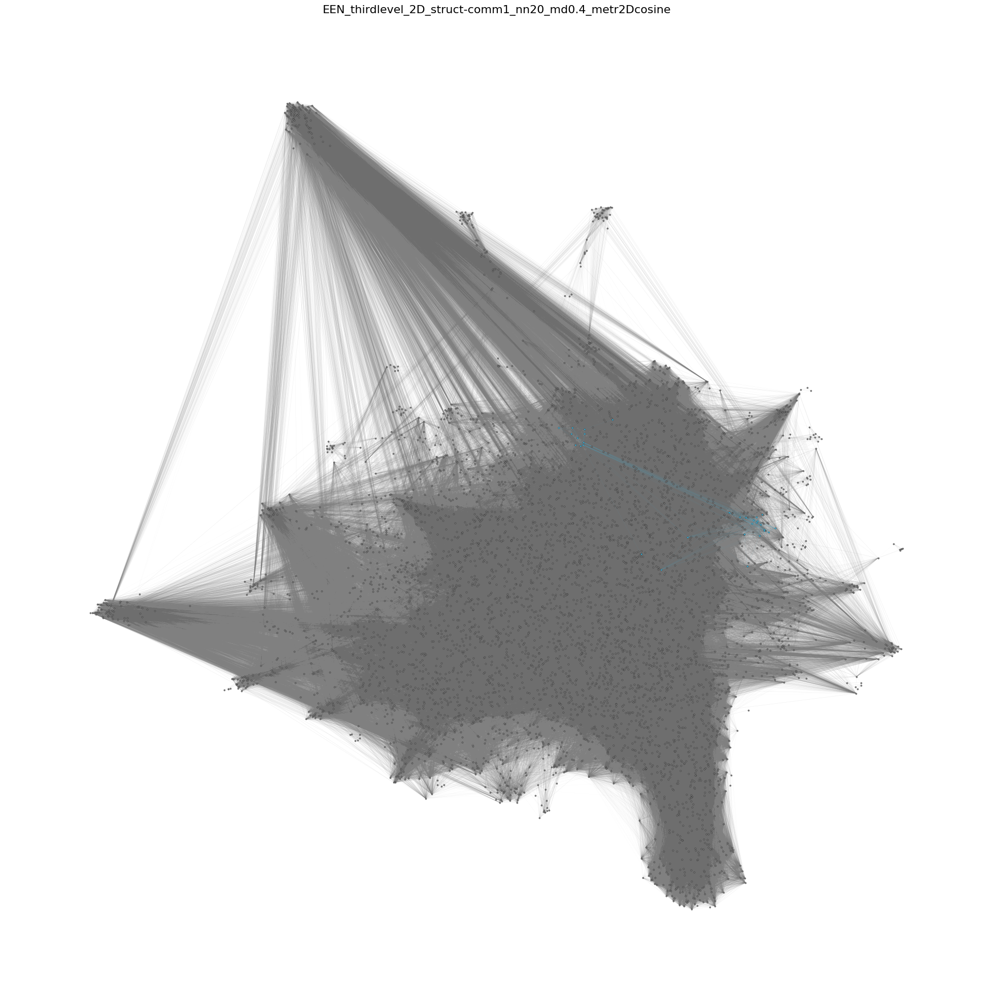

In [100]:

plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities_secondlevel)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_secondlevel[i],dict(*pos2D_allcommunities_secondlevel[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = check_colors_allcommunities_secondlevel[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_secondlevel[i],dict(*pos2D_allcommunities_secondlevel[i]), width = 0.5, edge_color = check_colors_allcommunities_secondlevel[i], alpha = 0.075)

plt.box(False)

plt.show()

In [14]:
# match community colors assigned to nodes-community assignment
d_nodecolors_hex = {} 
for node,comm in d_comm_second_selected.items():
    for com,col in d_comm_col.items():
        if comm == com:
            d_nodecolors_hex[node] = col 

d_nodecolors_hex_sorted = {key:d_nodecolors_hex[key] for key in posG2D_third}

# export postitions 
df_posG_export = pd.DataFrame(posG2D_third).T
df_posG_export[3]= list(d_nodecolors_hex_sorted.values())
df_posG_export
df_posG_export.to_csv('EEN_posG_'+layout_method+'_'+layoutname+'.csv',header=None,index=0)

### FIRST LEVEL

Number of exposures in community: 21
Specific Graph: Graph named 'Exposureome' with 21 nodes and 143 edges


/opt/anaconda3/envs/Exposurome/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of Nodes: (to match G_sub_first nodes):  21
communities of second level in third level community selected:  {30}
number of unique colors: 1
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1
Number of individual colors:  1


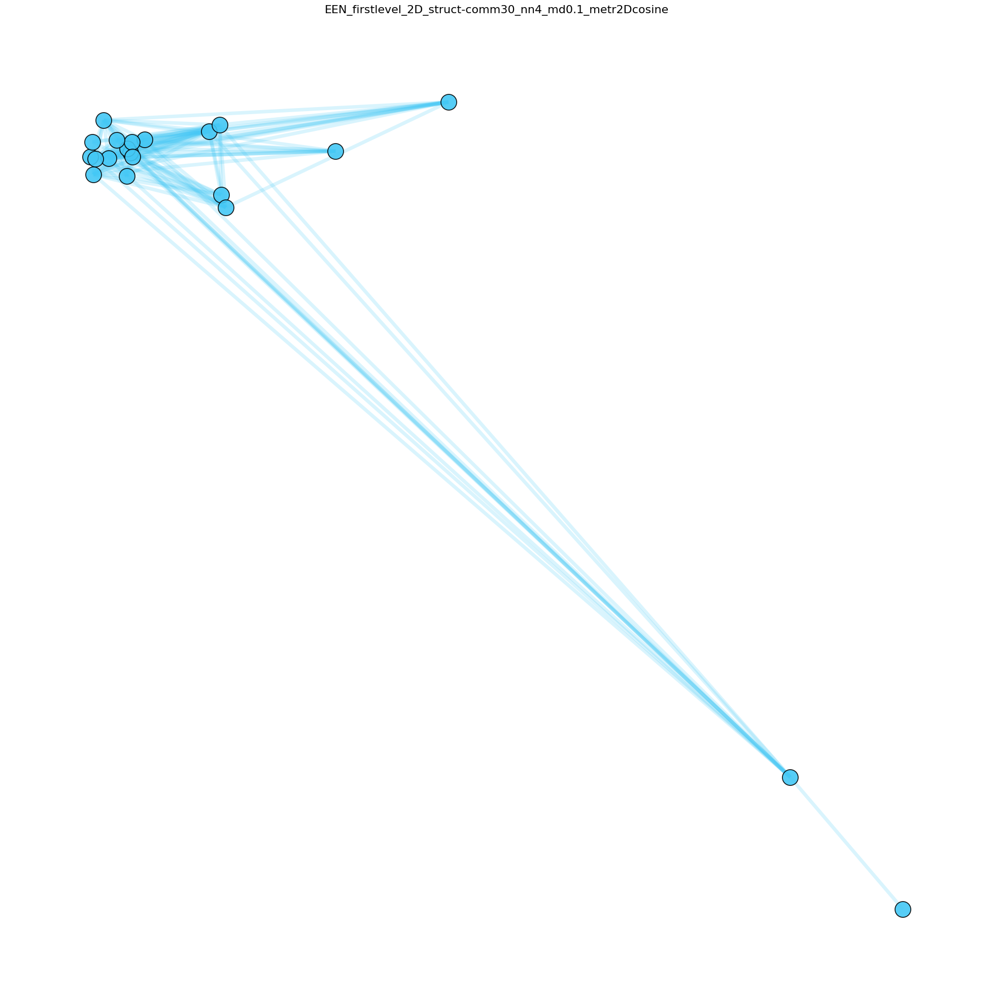

In [106]:
layoutname = 'firstlevel'

##########################################################
spec_comm_first = 30 #Salvo's selection 1_21
##########################################################

sublist_first = []
for k,v in d_comm_first.items():
    if v == spec_comm_first:
        sublist_first.append(k)

d_selectedcommunity_firstlevel = {spec_comm_first:sublist_first}
print("Number of exposures in community:" , len(*d_selectedcommunity_firstlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_first.values()),max(d_comm_first.values())):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community-1:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_first = subgraphs_subcommunities[spec_comm_first]
print("Specific Graph:" , G_sub_first)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_first) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_first, nodelist=list(G_sub_first.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_first.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_first.nodes())
FM_structural_sub.columns=list(G_sub_first.nodes())

n_n = 4
spr = 1.0
md = 0.1
metr2D = 'cosine'
posG2D_first = layout_portrait_umap(G_sub_first,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_first nodes): ', len(posG2D_first))

########################################
# COLORS 
########################################

d_comm_first_selected = {}
for node in G_sub_first.nodes():
    d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get unique color for each community 
colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(set_communities))
colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign previously assigned color (to remain same)
d_comm_col_new = {spec_comm_first:d_comm_col[1]} # dict(zip(set_communities , colorlist_fin))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_third.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for n_l in nodes_allcommunities_firstlevel:
    posG2D_comm = {}
    for n in n_l:
    # get positions from community nodes
        posG2D_comm[n] = posG2D_third[n]
    pos2D_allcommunities_firstlevel.append(posG2D_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col_new.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))


#######################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            pos2D_allcommunities_firstlevel[i], 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],pos2D_allcommunities_firstlevel[i], width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)

plt.savefig('output/Figures/SF15A_part3_v01_post_rev.pdf',dpi=300)
plt.savefig('output/Figures/SF15A_part3_v01_post_rev.png',dpi=300)
plt.show()

In [107]:
subgraphs_allcommunities_firstlevel[i].number_of_nodes()

21

In [108]:
'D000078306' in subgraphs_allcommunities_firstlevel[i].nodes()

True

In [109]:
chem_gene_df = pd.read_csv("input/CTD/CTD_chem_gene_ixns.tsv",delimiter= '\t', #import the database
            skipinitialspace=True)

#Let's define a dictionary that will convert the chemical name in chemical ID
chem_id_name_conversion = {}
for i,v in chem_gene_df.iterrows():
        chem_id_name_conversion[v["ChemicalID"]] = v["# ChemicalName"]

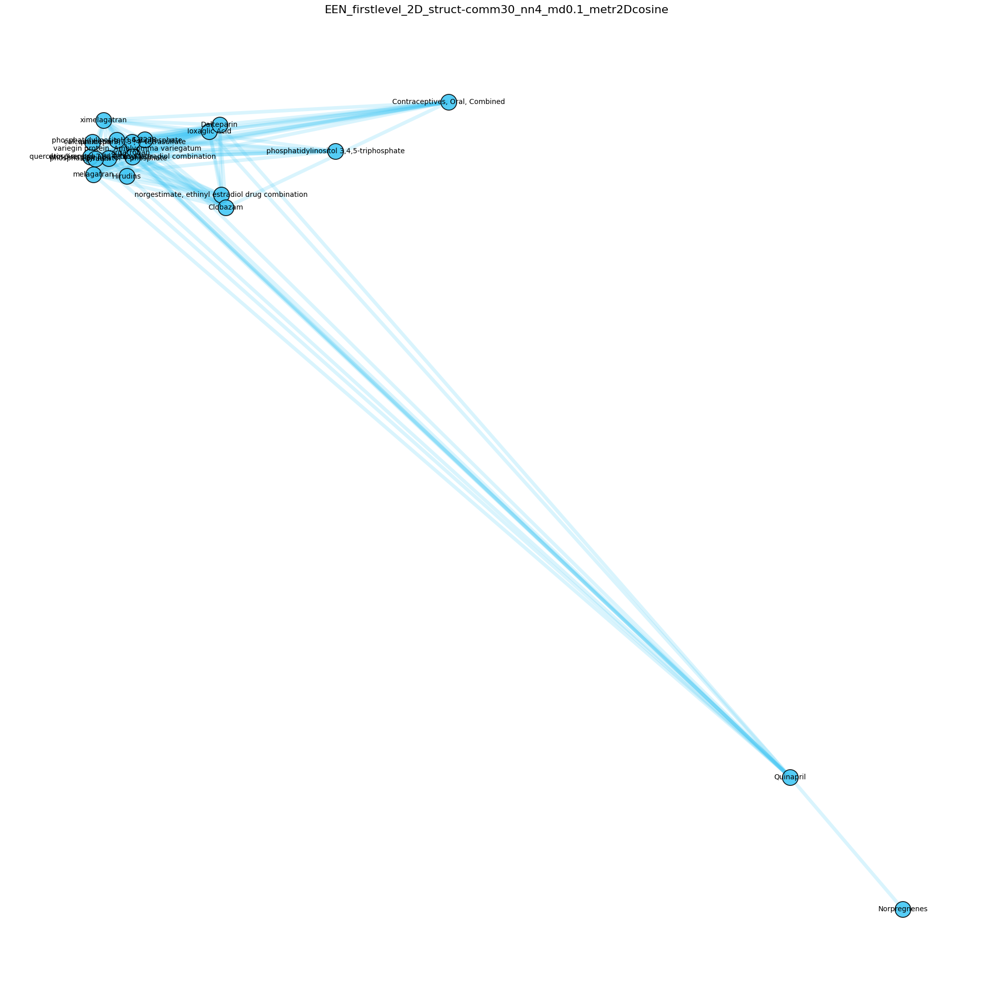

In [114]:

plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            pos2D_allcommunities_firstlevel[i], 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],pos2D_allcommunities_firstlevel[i], width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

subgraph_label_dict={}
for node in subgraphs_allcommunities_firstlevel[i].nodes():
    subgraph_label_dict[node]=chem_id_name_conversion[node]
    
subgraph_relabel = nx.relabel_nodes(subgraphs_allcommunities_firstlevel[i], subgraph_label_dict)
pos_relabel={}
for nodeid,nodename in subgraph_label_dict.items():
    pos_relabel[nodename]=pos2D_allcommunities_firstlevel[i][nodeid]

nx.draw_networkx_labels(subgraph_relabel, pos = pos_relabel,  font_color = 'black',font_size=10)
plt.box(False)

#plt.savefig('output/Figures/SF15A_part3_v03.pdf',dpi=300)
#plt.savefig('output/Figures/SF15A_part3_v03.png',dpi=300)
plt.show()